In [33]:
##My import cell
%matplotlib inline
import re
import requests
import textblob
import string
from datetime import *
import random
from scipy.misc import imread
from wordcloud import *
import os
import numpy as np
from collections import Counter
import pandas as pd
import networkx as nx
from matplotlib import pyplot
import matplotlib.pyplot as plt
import plotly as py
import seaborn as sbn
import math
from nltk.corpus import stopwords
import textatistic
from bs4 import BeautifulSoup
from subprocess import check_output
from IPython.display import HTML
#matplotlib.style.use('ggplot')
import psycopg2
py.offline.init_notebook_mode()

In [5]:
opt = pd.read_csv('/home/faculty/millbr02/pub/ecomm/order_products__train.csv')
products = pd.read_csv('/home/faculty/millbr02/pub/ecomm/products.csv')

In [6]:
msk = np.random.rand(len(opt)) < 0.8
train = opt[msk]
test = opt[~msk]

In [7]:
aco = train.groupby('order_id')
aco.get_group(36)['product_id']

8     39612
9     19660
11    43086
12    46620
13    34497
14    48679
15    46979
Name: product_id, dtype: int64

In [8]:
unique_orderids = aco.groups.keys()

In [9]:
%%time
iimat = {}
for oid in unique_orderids:
    for product1 in aco.get_group(oid)['product_id']:
        if int(product1) not in iimat:
            iimat[int(product1)] = {}
        for product2 in aco.get_group(oid)['product_id']:
            if product1 != product2:
                iimat[int(product1)][int(product2)] = iimat[int(product1)].get(int(product2),0) +1

CPU times: user 8min 23s, sys: 5.44 s, total: 8min 28s
Wall time: 8min 26s


In [10]:
%%time
msofar = 0
ones =0
for key in iimat:
    for i in iimat[key]:
        if iimat[key][i]==1:
            ones += 1
        if iimat[key][i] > msofar:
            msofar = iimat[key][i]
            print(key,i,msofar)

1 30720 2
1 11266 3
1 31759 4
1 6184 6
1 39657 7
1 40199 8
10 4138 23
34 24852 27
34 13176 35
45 24852 123
260 24852 216
432 24852 236
2295 15290 266
4605 21903 347
4605 47626 483
4605 24852 664
4920 24852 761
13176 47209 1543
13176 21137 1971
CPU times: user 3.9 s, sys: 24 ms, total: 3.92 s
Wall time: 3.91 s


In [11]:
delkeys = []
for i in iimat.keys():
    for k,v in iimat[i].items():
        if v == 1:
            delkeys.append((i,k))

In [12]:
for i, j in delkeys:
    del iimat[i][j]

In [13]:
import json
with open('item_item.json', 'w') as f:
    json.dump(iimat,f)

In [15]:
new_cat = pd.read_json('/home/faculty/millbr02/pub/item_item.json')
new_cat.head()

,1,10,100,1000,10000,10001,10005,10006,10008,10009,...,9985,9986,9989,999,9990,9993,9995,9996,9997,9998
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
def getval(d):
    return d[1]

recs = sorted(new_cat[13176].items(), key=getval, reverse=True)

In [17]:
def predictor(mat, item1, item2):
    recs = list(mat[item1].items()) + list(mat[item2].items())
    recs = sorted(recs, key=getval, reverse=True)
    recs = [recs[x][0] for x in range(min(5,len(recs)))]
    recs = list(set(recs))
    return recs

In [18]:
for p in predictor(new_cat,13176,21137):
    print(products[products.product_id == p].product_name)

19271    Veganic Sprouted Brown Rice Cacao Crisps
Name: product_name, dtype: object
10007    Sheeps Milk Maple Yogurt
Name: product_name, dtype: object
10010    Baby Diapers Size 2
Name: product_name, dtype: object
10004    Potstickers, Organic, Pork & Vegetable
Name: product_name, dtype: object
10016    Tilapia Filet
Name: product_name, dtype: object


In [19]:
test = pd.read_csv('/home/faculty/millbr02/pub/mytest.csv')
tco = train.groupby('order_id')

In [20]:
##gives us the our percent correct

hits = 0
count = 0
for order in tco.groups.keys():
    contents = list(tco.get_group(order).sort_values('add_to_cart_order').product_id)
    if len(contents) > 2:
        count += 1
        recs = predictor(iimat, contents[0], contents[1])
        basket = set(contents[3:])
        recs = set(recs)
        correct_recs = recs.intersection(basket)
        if len(correct_recs) >= 1:
            hits += 1
            
            
print(hits, count, hits/count)

KeyboardInterrupt: 

In [21]:
prod_train = products.merge(opt).sort_values(by='order_id').reset_index(drop=True)
new_df = prod_train.set_index(["order_id"]).reset_index()
df_group = new_df.groupby('order_id')

In [22]:
df_group.get_group(1).sort_values(by='add_to_cart_order').reset_index(drop=True)

,order_id,product_id,product_name,aisle_id,department_id,add_to_cart_order,reordered
0,1,49302,Bulgarian Yogurt,120,16,1,1
1,1,11109,Organic 4% Milk Fat Whole Milk Cottage Cheese,108,16,2,1
2,1,10246,Organic Celery Hearts,83,4,3,0
3,1,49683,Cucumber Kirby,83,4,4,0
4,1,43633,Lightly Smoked Sardines in Olive Oil,95,15,5,1
5,1,13176,Bag of Organic Bananas,24,4,6,0
6,1,47209,Organic Hass Avocado,24,4,7,0
7,1,22035,Organic Whole String Cheese,21,16,8,1


In [23]:
%%time
a2a = {}
for i in list(set(new_df.order_id)):

    new_df_group = df_group.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True)

    aisles_list = list(new_df_group.aisle_id)#grouped_object.get_group(i).sort_values(by='add_to_cart_order').reset_index(drop=True).aisle_id)

    for item in list(zip(aisles_list,aisles_list[1:])):
        if item[0] not in a2a:
            a2a[item[0]] = {item[1]:1}
        else:
            if item[1] not in a2a[item[0]]:
                a2a[item[0]][item[1]] = 1
            else:
                a2a[item[0]][item[1]] += 1

CPU times: user 2min 21s, sys: 1.24 s, total: 2min 22s
Wall time: 2min 22s


In [24]:
##NO NAN
best_df = pd.DataFrame(a2a).fillna(0)

In [25]:
best_df.head()

,1,2,3,4,5,6,7,8,9,10,...,125,126,127,128,129,130,131,132,133,134
1,188.0,5.0,34.0,21.0,6.0,6.0,4.0,7.0,16.0,0.0,...,2.0,2.0,1.0,16.0,19.0,15.0,12.0,0.0,1.0,0.0
2,12.0,134.0,23.0,21.0,6.0,2.0,9.0,3.0,44.0,2.0,...,2.0,0.0,2.0,28.0,24.0,8.0,55.0,1.0,2.0,2.0
3,23.0,19.0,4483.0,85.0,13.0,17.0,8.0,13.0,75.0,0.0,...,44.0,11.0,11.0,41.0,67.0,76.0,59.0,1.0,5.0,0.0
4,18.0,28.0,78.0,1164.0,41.0,11.0,17.0,10.0,116.0,3.0,...,10.0,7.0,13.0,52.0,110.0,45.0,132.0,1.0,9.0,1.0
5,6.0,12.0,21.0,42.0,91.0,5.0,6.0,2.0,41.0,2.0,...,0.0,0.0,2.0,24.0,31.0,10.0,25.0,0.0,2.0,0.0


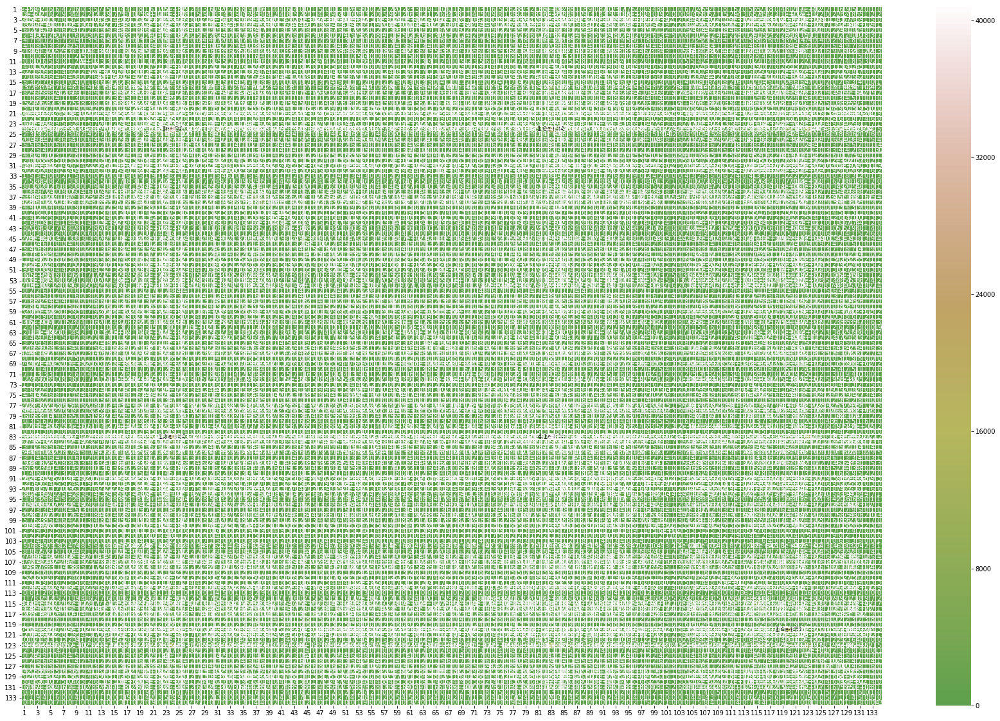

In [26]:
a4_dims = (30, 20)
fig, ax = pyplot.subplots(figsize=a4_dims)
ax = sbn.heatmap(best_df, vmin=0,center=0, annot=True, linewidths=.5, cmap="gist_earth")

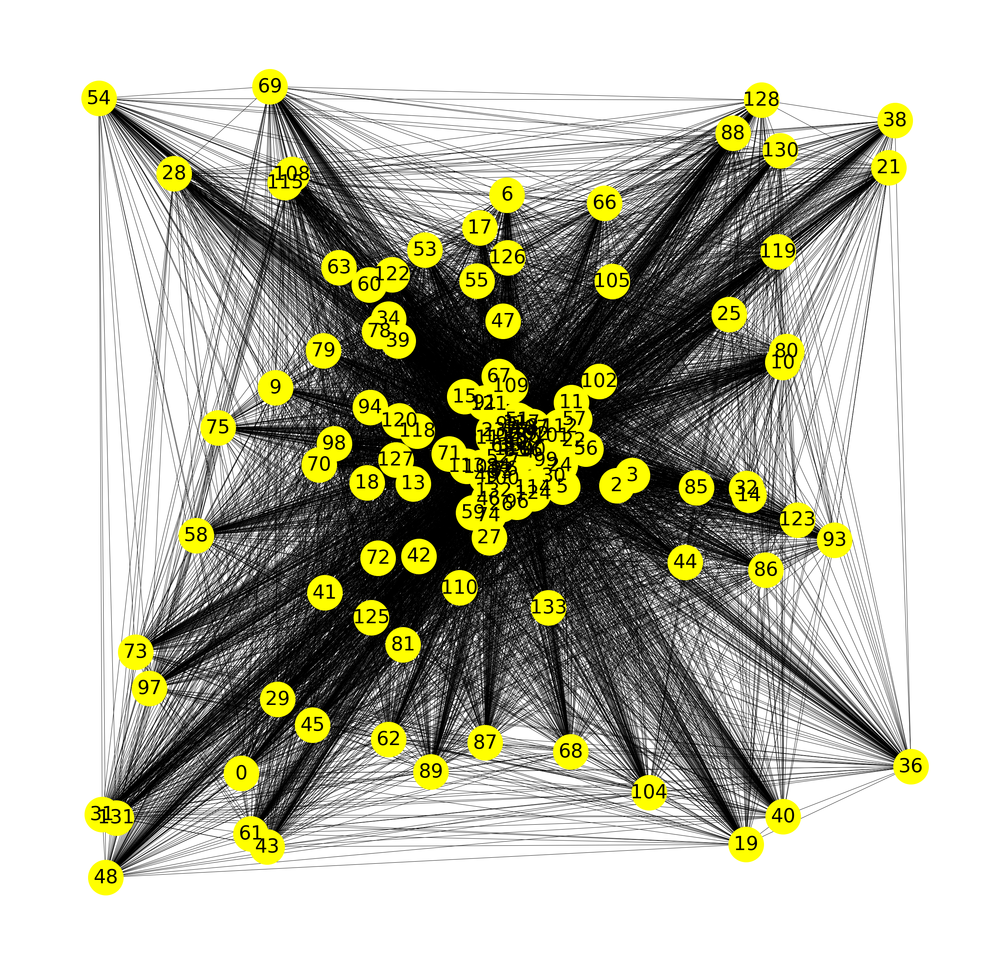

In [27]:
#network graph
A=np.matrix(best_df)
G=nx.from_numpy_matrix(A)
G.edges(data=True)
Gfig, gax = plt.subplots(figsize = (50,50))
nx.draw(G,nx.spring_layout(G, iterations=5), ax=gax, with_labels=True, node_size=10000, node_color='yellow', font_size = 55)

In [28]:
best_df.columns = [int(y) for y in best_df.columns]
best_df['total'] = best_df.apply(lambda x : x.sum(), axis=1)
best_df.sort_values('total', ascending=False, inplace=True)
best_df.head()

,1,2,3,4,5,6,7,8,9,10,...,126,127,128,129,130,131,132,133,134,total
83,168.0,366.0,689.0,555.0,290.0,107.0,209.0,61.0,902.0,32.0,...,35.0,59.0,798.0,556.0,350.0,1044.0,17.0,22.0,12.0,141527.0
24,213.0,275.0,1125.0,505.0,138.0,97.0,108.0,109.0,531.0,23.0,...,48.0,62.0,631.0,516.0,492.0,581.0,11.0,40.0,5.0,132175.0
123,165.0,184.0,550.0,337.0,108.0,46.0,83.0,57.0,455.0,10.0,...,23.0,27.0,394.0,302.0,259.0,465.0,5.0,21.0,5.0,72974.0
120,73.0,81.0,510.0,236.0,45.0,47.0,24.0,27.0,189.0,1.0,...,16.0,32.0,187.0,200.0,209.0,209.0,5.0,11.0,3.0,50188.0
21,78.0,262.0,296.0,298.0,99.0,28.0,49.0,18.0,594.0,11.0,...,13.0,25.0,579.0,238.0,178.0,524.0,2.0,10.0,9.0,39177.0


In [29]:
ordered_row = best_df.index
ordered_row = ordered_row.tolist()
best_df.head(10)

,1,2,3,4,5,6,7,8,9,10,...,126,127,128,129,130,131,132,133,134,total
83,168.0,366.0,689.0,555.0,290.0,107.0,209.0,61.0,902.0,32.0,...,35.0,59.0,798.0,556.0,350.0,1044.0,17.0,22.0,12.0,141527.0
24,213.0,275.0,1125.0,505.0,138.0,97.0,108.0,109.0,531.0,23.0,...,48.0,62.0,631.0,516.0,492.0,581.0,11.0,40.0,5.0,132175.0
123,165.0,184.0,550.0,337.0,108.0,46.0,83.0,57.0,455.0,10.0,...,23.0,27.0,394.0,302.0,259.0,465.0,5.0,21.0,5.0,72974.0
120,73.0,81.0,510.0,236.0,45.0,47.0,24.0,27.0,189.0,1.0,...,16.0,32.0,187.0,200.0,209.0,209.0,5.0,11.0,3.0,50188.0
21,78.0,262.0,296.0,298.0,99.0,28.0,49.0,18.0,594.0,11.0,...,13.0,25.0,579.0,238.0,178.0,524.0,2.0,10.0,9.0,39177.0
115,46.0,60.0,344.0,109.0,33.0,33.0,23.0,25.0,115.0,12.0,...,21.0,38.0,93.0,108.0,93.0,116.0,4.0,23.0,7.0,29102.0
107,47.0,72.0,497.0,235.0,42.0,25.0,20.0,42.0,150.0,5.0,...,18.0,32.0,217.0,231.0,114.0,169.0,5.0,11.0,7.0,29086.0
84,61.0,73.0,231.0,197.0,42.0,31.0,22.0,27.0,114.0,4.0,...,21.0,25.0,120.0,126.0,115.0,160.0,1.0,13.0,6.0,25468.0
91,36.0,42.0,217.0,93.0,24.0,52.0,11.0,24.0,109.0,4.0,...,9.0,15.0,98.0,97.0,163.0,113.0,3.0,9.0,3.0,22240.0
112,55.0,79.0,190.0,121.0,36.0,24.0,21.0,19.0,156.0,6.0,...,15.0,22.0,177.0,162.0,99.0,153.0,1.0,12.0,9.0,21227.0


In [30]:
am = best_df.values.tolist()[:10][:10]
for i in range(len(am)):
    am[i][i] = 0.0
len(am[:10][:10])

10

In [31]:
import pprint
pprint.pprint(am[:10][:10], width=1400)

[[0.0, 366.0, 689.0, 555.0, 290.0, 107.0, 209.0, 61.0, 902.0, 32.0, 28.0, 122.0, 274.0, 680.0, 111.0, 3634.0, 856.0, 50.0, 1024.0, 112.0, 3687.0, 44.0, 264.0, 18209.0, 162.0, 378.0, 27.0, 41.0, 168.0, 404.0, 1236.0, 1007.0, 51.0, 206.0, 920.0, 869.0, 989.0, 714.0, 183.0, 70.0, 71.0, 315.0, 416.0, 12.0, 473.0, 28.0, 105.0, 83.0, 828.0, 329.0, 404.0, 465.0, 826.0, 499.0, 12.0, 48.0, 228.0, 118.0, 1304.0, 63.0, 325.0, 46.0, 792.0, 130.0, 80.0, 850.0, 1309.0, 95.0, 1543.0, 68.0, 72.0, 859.0, 18.0, 192.0, 160.0, 50.0, 565.0, 948.0, 382.0, 25.0, 1769.0, 17.0, 40783.0, 2032.0, 103.0, 1856.0, 28.0, 692.0, 414.0, 38.0, 2034.0, 530.0, 539.0, 418.0, 282.0, 1297.0, 55.0, 773.0, 234.0, 755.0, 36.0, 15.0, 23.0, 1031.0, 232.0, 1099.0, 1592.0, 1058.0, 18.0, 529.0, 46.0, 1789.0, 6.0, 159.0, 1720.0, 2188.0, 815.0, 14.0, 49.0, 3147.0, 683.0, 556.0, 12087.0, 20.0, 38.0, 35.0, 59.0, 798.0, 556.0, 350.0, 1044.0, 17.0, 22.0, 12.0, 141527.0],
 [213.0, 0.0, 1125.0, 505.0, 138.0, 97.0, 108.0, 109.0, 531.0, 23.0

In [35]:
%load_ext py_d3

In [36]:
%%d3 4.11.0

<style>

.group-tick line {
  stroke: #000;
}

.ribbons {
  fill-opacity: 0.67;
}
</style>

<svg width=960 height=960></svg>

<script>
var matrix = [[0.0, 18209.0, 12087.0, 3147.0, 3687.0, 1720.0, 1592.0, 2032.0, 2034.0, 1789.0, 2188.0, 989.0, 1236.0, 948.0, 1856.0, 714.0, 689.0, 1297.0, 3634.0, 683.0, 1543.0, 1309.0, 565.0, 773.0, 530.0, 1769.0, 1058.0, 856.0, 1099.0, 815.0, 692.0, 1304.0, 499.0, 1007.0, 826.0, 1044.0, 473.0, 869.0, 1024.0, 555.0, 902.0, 325.0, 859.0, 465.0, 539.0, 1031.0, 418.0, 556.0, 798.0, 755.0, 378.0, 382.0, 850.0, 329.0, 264.0, 350.0, 792.0, 159.0, 828.0, 404.0, 680.0, 920.0, 416.0, 529.0, 414.0, 315.0, 232.0, 160.0, 130.0, 234.0, 274.0, 366.0, 228.0, 192.0, 404.0, 206.0, 282.0, 83.0, 112.0, 556.0, 290.0, 168.0, 103.0, 168.0, 162.0, 71.0, 59.0, 46.0, 105.0, 72.0, 107.0, 122.0, 70.0, 27.0, 80.0, 118.0, 63.0, 209.0, 44.0, 38.0, 61.0, 28.0, 41.0, 68.0, 55.0, 38.0, 36.0, 183.0, 48.0, 35.0, 46.0, 28.0, 111.0, 49.0, 25.0, 22.0, 28.0, 50.0, 20.0, 18.0, 50.0, 95.0, 51.0, 12.0, 18.0, 23.0, 12.0, 14.0, 32.0, 12.0, 15.0, 17.0, 6.0, 17.0],
 [16344.0, 0.0, 11124.0, 5329.0, 3058.0, 3256.0, 1900.0, 4412.0, 3045.0, 2304.0, 2114.0, 1287.0, 1992.0, 1257.0, 2372.0, 841.0, 1125.0, 1267.0, 1798.0, 1123.0, 782.0, 1169.0, 805.0, 1161.0, 713.0, 645.0, 928.0, 745.0, 846.0, 982.0, 910.0, 738.0, 622.0, 2428.0, 1118.0, 581.0, 569.0, 737.0, 729.0, 505.0, 531.0, 511.0, 539.0, 719.0, 773.0, 478.0, 605.0, 516.0, 631.0, 600.0, 570.0, 404.0, 420.0, 510.0, 503.0, 492.0, 392.0, 184.0, 424.0, 288.0, 367.0, 443.0, 309.0, 286.0, 243.0, 254.0, 229.0, 169.0, 227.0, 274.0, 313.0, 275.0, 315.0, 190.0, 208.0, 211.0, 215.0, 153.0, 139.0, 252.0, 138.0, 198.0, 130.0, 213.0, 121.0, 99.0, 62.0, 84.0, 137.0, 105.0, 97.0, 83.0, 64.0, 40.0, 102.0, 95.0, 59.0, 108.0, 35.0, 85.0, 109.0, 46.0, 41.0, 76.0, 45.0, 41.0, 22.0, 145.0, 63.0, 48.0, 31.0, 37.0, 70.0, 52.0, 18.0, 40.0, 49.0, 32.0, 44.0, 21.0, 95.0, 59.0, 45.0, 20.0, 33.0, 25.0, 20.0, 22.0, 23.0, 5.0, 24.0, 24.0, 25.0, 11.0],
 [11711.0, 12371.0, 0.0, 2312.0, 2131.0, 1285.0, 1131.0, 1448.0, 1323.0, 1040.0, 1523.0, 694.0, 945.0, 727.0, 1162.0, 528.0, 550.0, 901.0, 1031.0, 504.0, 560.0, 1095.0, 404.0, 574.0, 334.0, 565.0, 528.0, 364.0, 562.0, 547.0, 482.0, 430.0, 333.0, 1115.0, 521.0, 465.0, 302.0, 415.0, 425.0, 337.0, 455.0, 269.0, 379.0, 337.0, 378.0, 323.0, 272.0, 302.0, 394.0, 392.0, 268.0, 268.0, 281.0, 284.0, 269.0, 259.0, 292.0, 115.0, 382.0, 186.0, 285.0, 350.0, 205.0, 222.0, 313.0, 208.0, 150.0, 117.0, 96.0, 131.0, 204.0, 184.0, 174.0, 98.0, 151.0, 143.0, 130.0, 89.0, 84.0, 200.0, 108.0, 91.0, 75.0, 165.0, 96.0, 64.0, 27.0, 43.0, 85.0, 41.0, 46.0, 66.0, 35.0, 18.0, 60.0, 59.0, 35.0, 83.0, 35.0, 39.0, 57.0, 25.0, 20.0, 49.0, 27.0, 30.0, 16.0, 80.0, 33.0, 23.0, 21.0, 19.0, 50.0, 28.0, 26.0, 21.0, 26.0, 28.0, 19.0, 17.0, 39.0, 39.0, 24.0, 13.0, 11.0, 15.0, 8.0, 9.0, 10.0, 5.0, 12.0, 14.0, 12.0, 5.0],
 [3010.0, 5350.0, 2181.0, 0.0, 1397.0, 980.0, 714.0, 1933.0, 1108.0, 803.0, 590.0, 540.0, 789.0, 496.0, 776.0, 441.0, 510.0, 497.0, 297.0, 554.0, 274.0, 407.0, 311.0, 427.0, 370.0, 201.0, 444.0, 221.0, 313.0, 341.0, 310.0, 234.0, 244.0, 216.0, 473.0, 209.0, 226.0, 267.0, 167.0, 236.0, 189.0, 208.0, 177.0, 329.0, 340.0, 151.0, 226.0, 200.0, 187.0, 403.0, 242.0, 201.0, 136.0, 216.0, 191.0, 209.0, 135.0, 97.0, 142.0, 114.0, 133.0, 133.0, 116.0, 100.0, 72.0, 77.0, 85.0, 80.0, 102.0, 144.0, 108.0, 81.0, 257.0, 63.0, 61.0, 74.0, 66.0, 104.0, 50.0, 60.0, 45.0, 62.0, 44.0, 73.0, 58.0, 52.0, 32.0, 31.0, 43.0, 66.0, 47.0, 30.0, 31.0, 20.0, 55.0, 45.0, 24.0, 24.0, 29.0, 32.0, 27.0, 21.0, 16.0, 37.0, 18.0, 21.0, 12.0, 28.0, 19.0, 16.0, 14.0, 10.0, 19.0, 19.0, 11.0, 11.0, 9.0, 12.0, 6.0, 10.0, 18.0, 17.0, 14.0, 13.0, 12.0, 8.0, 6.0, 6.0, 1.0, 3.0, 6.0, 7.0, 8.0, 5.0],
 [3717.0, 3448.0, 2199.0, 1474.0, 0.0, 641.0, 825.0, 938.0, 588.0, 932.0, 486.0, 425.0, 410.0, 712.0, 732.0, 334.0, 296.0, 1237.0, 413.0, 373.0, 339.0, 448.0, 278.0, 303.0, 212.0, 420.0, 816.0, 249.0, 440.0, 313.0, 280.0, 389.0, 235.0, 285.0, 427.0, 524.0, 206.0, 359.0, 238.0, 298.0, 594.0, 211.0, 250.0, 276.0, 309.0, 203.0, 150.0, 238.0, 579.0, 171.0, 154.0, 197.0, 126.0, 160.0, 152.0, 178.0, 124.0, 78.0, 185.0, 190.0, 134.0, 149.0, 214.0, 175.0, 164.0, 131.0, 139.0, 71.0, 82.0, 125.0, 115.0, 262.0, 88.0, 72.0, 167.0, 98.0, 91.0, 73.0, 41.0, 112.0, 99.0, 50.0, 41.0, 78.0, 52.0, 36.0, 25.0, 20.0, 24.0, 50.0, 28.0, 62.0, 34.0, 21.0, 30.0, 68.0, 18.0, 49.0, 15.0, 39.0, 18.0, 20.0, 16.0, 10.0, 21.0, 21.0, 16.0, 19.0, 23.0, 13.0, 25.0, 11.0, 21.0, 18.0, 15.0, 10.0, 11.0, 15.0, 12.0, 17.0, 11.0, 12.0, 19.0, 6.0, 5.0, 7.0, 7.0, 9.0, 11.0, 9.0, 8.0, 7.0, 6.0, 2.0],
 [1547.0, 2897.0, 1110.0, 902.0, 570.0, 0.0, 580.0, 743.0, 613.0, 380.0, 256.0, 373.0, 677.0, 334.0, 389.0, 253.0, 344.0, 248.0, 152.0, 235.0, 159.0, 268.0, 935.0, 492.0, 139.0, 109.0, 190.0, 154.0, 188.0, 210.0, 196.0, 98.0, 350.0, 243.0, 278.0, 116.0, 249.0, 147.0, 152.0, 109.0, 115.0, 167.0, 145.0, 163.0, 160.0, 105.0, 301.0, 108.0, 93.0, 201.0, 265.0, 122.0, 77.0, 140.0, 171.0, 93.0, 63.0, 122.0, 84.0, 73.0, 57.0, 68.0, 74.0, 76.0, 63.0, 54.0, 45.0, 101.0, 195.0, 54.0, 73.0, 60.0, 60.0, 62.0, 30.0, 43.0, 54.0, 56.0, 58.0, 34.0, 33.0, 30.0, 58.0, 46.0, 55.0, 85.0, 38.0, 49.0, 30.0, 24.0, 33.0, 17.0, 35.0, 42.0, 30.0, 22.0, 34.0, 23.0, 29.0, 38.0, 25.0, 28.0, 15.0, 31.0, 15.0, 25.0, 12.0, 14.0, 32.0, 21.0, 26.0, 25.0, 12.0, 11.0, 18.0, 23.0, 24.0, 6.0, 45.0, 17.0, 20.0, 5.0, 14.0, 12.0, 12.0, 7.0, 15.0, 12.0, 12.0, 7.0, 2.0, 8.0, 7.0, 4.0],
 [1648.0, 2225.0, 1185.0, 882.0, 887.0, 696.0, 0.0, 529.0, 416.0, 501.0, 301.0, 496.0, 456.0, 811.0, 290.0, 336.0, 497.0, 379.0, 142.0, 417.0, 201.0, 1137.0, 457.0, 345.0, 141.0, 140.0, 308.0, 123.0, 237.0, 335.0, 218.0, 191.0, 202.0, 173.0, 226.0, 169.0, 456.0, 150.0, 124.0, 235.0, 150.0, 448.0, 173.0, 209.0, 198.0, 104.0, 192.0, 231.0, 217.0, 145.0, 187.0, 195.0, 118.0, 344.0, 349.0, 114.0, 92.0, 77.0, 70.0, 439.0, 65.0, 55.0, 126.0, 97.0, 104.0, 96.0, 102.0, 61.0, 111.0, 90.0, 98.0, 72.0, 85.0, 58.0, 61.0, 52.0, 41.0, 84.0, 41.0, 35.0, 42.0, 41.0, 42.0, 47.0, 44.0, 37.0, 32.0, 51.0, 28.0, 35.0, 25.0, 25.0, 20.0, 44.0, 20.0, 31.0, 33.0, 20.0, 19.0, 76.0, 42.0, 23.0, 19.0, 18.0, 21.0, 18.0, 9.0, 8.0, 16.0, 18.0, 16.0, 20.0, 13.0, 18.0, 19.0, 11.0, 8.0, 11.0, 21.0, 17.0, 22.0, 6.0, 6.0, 7.0, 9.0, 9.0, 4.0, 14.0, 5.0, 7.0, 6.0, 7.0, 4.0, 5.0],
 [1737.0, 3573.0, 1228.0, 1429.0, 842.0, 724.0, 428.0, 0.0, 735.0, 626.0, 287.0, 319.0, 556.0, 272.0, 835.0, 213.0, 231.0, 283.0, 163.0, 517.0, 183.0, 200.0, 309.0, 290.0, 184.0, 129.0, 286.0, 266.0, 220.0, 163.0, 196.0, 111.0, 182.0, 244.0, 578.0, 160.0, 142.0, 295.0, 113.0, 197.0, 114.0, 150.0, 118.0, 200.0, 220.0, 93.0, 157.0, 126.0, 120.0, 89.0, 163.0, 130.0, 67.0, 128.0, 76.0, 115.0, 57.0, 70.0, 90.0, 56.0, 73.0, 80.0, 86.0, 44.0, 58.0, 39.0, 96.0, 77.0, 84.0, 75.0, 76.0, 73.0, 68.0, 49.0, 22.0, 53.0, 38.0, 44.0, 36.0, 45.0, 42.0, 45.0, 31.0, 61.0, 21.0, 36.0, 25.0, 20.0, 19.0, 28.0, 31.0, 25.0, 30.0, 21.0, 23.0, 18.0, 19.0, 22.0, 20.0, 21.0, 27.0, 13.0, 10.0, 22.0, 16.0, 17.0, 8.0, 13.0, 24.0, 21.0, 14.0, 12.0, 9.0, 12.0, 12.0, 13.0, 7.0, 7.0, 12.0, 6.0, 13.0, 8.0, 4.0, 9.0, 6.0, 11.0, 9.0, 8.0, 4.0, 6.0, 7.0, 5.0, 3.0, 1.0],
 [1897.0, 2865.0, 1193.0, 965.0, 563.0, 633.0, 351.0, 939.0, 0.0, 390.0, 436.0, 336.0, 462.0, 214.0, 536.0, 179.0, 217.0, 226.0, 188.0, 425.0, 194.0, 245.0, 126.0, 253.0, 101.0, 155.0, 169.0, 237.0, 168.0, 200.0, 229.0, 133.0, 165.0, 117.0, 347.0, 113.0, 127.0, 175.0, 153.0, 93.0, 109.0, 111.0, 136.0, 150.0, 164.0, 130.0, 141.0, 97.0, 98.0, 138.0, 170.0, 97.0, 141.0, 85.0, 85.0, 163.0, 94.0, 51.0, 69.0, 48.0, 133.0, 74.0, 50.0, 60.0, 49.0, 95.0, 50.0, 38.0, 53.0, 45.0, 46.0, 42.0, 101.0, 49.0, 30.0, 34.0, 38.0, 32.0, 35.0, 33.0, 24.0, 52.0, 23.0, 36.0, 40.0, 24.0, 15.0, 12.0, 34.0, 31.0, 52.0, 17.0, 19.0, 10.0, 45.0, 45.0, 15.0, 11.0, 14.0, 20.0, 24.0, 10.0, 12.0, 26.0, 12.0, 16.0, 11.0, 13.0, 10.0, 9.0, 5.0, 9.0, 19.0, 8.0, 6.0, 9.0, 4.0, 13.0, 2.0, 5.0, 12.0, 15.0, 6.0, 5.0, 6.0, 5.0, 4.0, 6.0, 4.0, 3.0, 2.0, 0.0, 2.0, 3.0],
 [1605.0, 2391.0, 1007.0, 784.0, 761.0, 481.0, 447.0, 908.0, 450.0, 0.0, 268.0, 299.0, 382.0, 307.0, 569.0, 244.0, 190.0, 560.0, 173.0, 296.0, 168.0, 253.0, 244.0, 197.0, 135.0, 105.0, 219.0, 142.0, 273.0, 119.0, 356.0, 136.0, 184.0, 175.0, 238.0, 153.0, 124.0, 215.0, 118.0, 121.0, 156.0, 136.0, 163.0, 178.0, 322.0, 89.0, 106.0, 162.0, 177.0, 88.0, 150.0, 111.0, 69.0, 81.0, 97.0, 99.0, 78.0, 53.0, 68.0, 60.0, 78.0, 73.0, 108.0, 75.0, 64.0, 67.0, 77.0, 49.0, 75.0, 74.0, 84.0, 79.0, 66.0, 47.0, 32.0, 45.0, 63.0, 46.0, 28.0, 35.0, 36.0, 36.0, 19.0, 55.0, 26.0, 29.0, 22.0, 15.0, 14.0, 30.0, 24.0, 28.0, 15.0, 22.0, 18.0, 67.0, 26.0, 21.0, 12.0, 16.0, 19.0, 12.0, 6.0, 12.0, 6.0, 14.0, 7.0, 11.0, 14.0, 15.0, 12.0, 7.0, 24.0, 9.0, 8.0, 12.0, 6.0, 14.0, 11.0, 7.0, 7.0, 10.0, 7.0, 6.0, 6.0, 10.0, 4.0, 11.0, 6.0, 9.0, 4.0, 2.0, 4.0, 1.0]] 





;

var svg = d3.select("svg"),
    width = +svg.attr("width"),
    height = +svg.attr("height"),
    outerRadius = Math.min(width, height) * 0.5 - 40,
    innerRadius = outerRadius - 30;

var formatValue = d3.formatPrefix(",.0", 1e3);

var chord = d3.chord()
    .padAngle(0.05)
    .sortSubgroups(d3.descending);

var arc = d3.arc()
    .innerRadius(innerRadius)
    .outerRadius(outerRadius);

var ribbon = d3.ribbon()
    .radius(innerRadius);

var color = d3.scaleOrdinal()
    .domain(d3.range(4))
    .range(["#000000", "#FFDD89", "#957244", "#F26223"]);

var g = svg.append("g")
    .attr("transform", "translate(" + width / 2 + "," + height / 2 + ")")
    .datum(chord(matrix));

var group = g.append("g")
    .attr("class", "groups")
  .selectAll("g")
  .data(function(chords) { return chords.groups; })
  .enter().append("g");

group.append("path")
    .style("fill", function(d) { return color(d.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.index)).darker(); })
    .attr("d", arc);

var groupTick = group.selectAll(".group-tick")
  .data(function(d) { return groupTicks(d, 1e3); })
  .enter().append("g")
    .attr("class", "group-tick")
    .attr("transform", function(d) { return "rotate(" + (d.angle * 180 / Math.PI - 90) + ") translate(" + outerRadius + ",0)"; });

groupTick.append("line")
    .attr("x2", 6);

groupTick
  .filter(function(d) { return d.value % 5e3 === 0; })
  .append("text")
    .attr("x", 8)
    .attr("dy", ".35em")
    .attr("transform", function(d) { return d.angle > Math.PI ? "rotate(180) translate(-16)" : null; })
    .style("text-anchor", function(d) { return d.angle > Math.PI ? "end" : null; })
    .text(function(d) { return formatValue(d.value); });

g.append("g")
    .attr("class", "ribbons")
  .selectAll("path")
  .data(function(chords) { return chords; })
  .enter().append("path")
    .attr("d", ribbon)
    .style("fill", function(d) { return color(d.target.index); })
    .style("stroke", function(d) { return d3.rgb(color(d.target.index)).darker(); });

// Returns an array of tick angles and values for a given group and step.
function groupTicks(d, step) {
  var k = (d.endAngle - d.startAngle) / d.value;
  return d3.range(0, d.value, step).map(function(value) {
    return {value: value, angle: value * k + d.startAngle};
  });
}

</script>
